In [1]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-218a8d98-b2ea-fdd7-bb1d-b4e71179f7b5)


In [2]:
#importing modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
#reading csv file
df=pd.read_csv('/content/train.csv')
df.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [4]:
#dropping unnecessary coulmns
df.drop(['id','title','author'],axis=1,inplace=True)
df.head()

,text,label
0,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,Ever get the feeling your life circles the rou...,0
2,"Why the Truth Might Get You Fired October 29, ...",1
3,Videos 15 Civilians Killed In Single US Airstr...,1
4,Print \nAn Iranian woman has been sentenced to...,1


In [5]:
#checking null values 
df.isnull().sum()

text     39
label     0
dtype: int64

In [6]:
#droppping null values
df=df.dropna()

In [7]:
#resetting index
df.reset_index(inplace=True)

In [8]:
#spliiting into columns and features
X=df.drop('label',axis=1)
y=df['label']

In [9]:
#dropping index
X.drop(['index'],axis=1,inplace=True)

In [10]:
X.shape, y.shape

((20761, 1), (20761,))

In [11]:
#checking distribution of label
y.value_counts()

0    10387
1    10374
Name: label, dtype: int64

In [12]:
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout, Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.models import Sequential

In [13]:
voc_size=5000
import nltk
import re
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [15]:
from nltk.stem.porter import PorterStemmer
ps = PorterStemmer()
corpus = []
for i in range(0, len(X)):
    review = re.sub('[^a-zA-Z]', ' ', X['text'][i])
    review = review.lower()
    review = review.split()
    
    review = [ps.stem(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

In [16]:
#converting words to one hot representation
onehot_repr=[one_hot(words,voc_size)for words in corpus] 
onehot_repr

[[2577,
  2152,
  4814,
  1435,
  4754,
  4999,
  4138,
  1981,
  4573,
  3167,
  1316,
  4613,
  4793,
  4555,
  1981,
  4573,
  3342,
  1215,
  1018,
  4133,
  2867,
  3261,
  3270,
  2752,
  4293,
  2769,
  2916,
  4144,
  553,
  2929,
  3423,
  1950,
  1137,
  2956,
  3626,
  3808,
  1242,
  4273,
  595,
  4999,
  3259,
  2577,
  4687,
  4814,
  2527,
  4795,
  3867,
  2429,
  1089,
  1137,
  2956,
  863,
  140,
  4999,
  2351,
  73,
  4138,
  1133,
  1242,
  2527,
  4191,
  1901,
  1854,
  3819,
  74,
  4191,
  4457,
  1411,
  4687,
  302,
  3845,
  831,
  4999,
  2223,
  688,
  3167,
  3236,
  3457,
  3845,
  1105,
  2429,
  4999,
  2820,
  3457,
  1105,
  4687,
  1411,
  2,
  2577,
  1344,
  41,
  29,
  3845,
  4909,
  4679,
  4191,
  1335,
  4165,
  2483,
  4754,
  1653,
  2818,
  4985,
  251,
  4138,
  490,
  29,
  3845,
  3058,
  1981,
  4573,
  3984,
  3753,
  3626,
  814,
  3167,
  1242,
  1393,
  4985,
  1242,
  1751,
  1928,
  4191,
  464,
  4373,
  225,
  2122,
  2828,
 

In [17]:
#adding padding to sentences
sent_length=20
embedded_docs=pad_sequences(onehot_repr,padding='pre',maxlen=sent_length)
print(embedded_docs)

[[2424 1243 1901 ... 2690 3697 2978]
 [3709 1492 2998 ...  638  699 3185]
 [4879 1630 2012 ... 1307 2107 4510]
 ...
 [ 477 4190 2027 ... 4568 1340 4200]
 [2782 4773 1824 ...   95  323 2087]
 [2899 3454 3504 ... 4234 1195 3997]]


In [18]:
## Creating model
embedding_vector_features=40
model=Sequential()
model.add(Embedding(voc_size,embedding_vector_features,input_length=sent_length))
model.add(Bidirectional(LSTM(100)))
model.add(Dropout(0.3))
model.add(Dense(1,activation='sigmoid'))
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 20, 40)            200000    
                                                                 
 bidirectional (Bidirectiona  (None, 200)              112800    
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 200)               0         
                                                                 
 dense (Dense)               (None, 1)                 201       
                                                                 
Total params: 313,001
Trainable params: 313,001
Non-trainable params: 0
_________________________________________________________________
None


In [19]:
len(embedded_docs),y.shape

(20761, (20761,))

In [20]:
#converting to array
X_final=np.array(embedded_docs)
y_final=np.array(y)

In [21]:
X_final.shape,y_final.shape

((20761, 20), (20761,))

In [22]:
#splitting data into train and test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size=0.20, random_state=42)

In [24]:
#Training the model
hist=model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=30,batch_size=64).history

Epoch 1/30
260/260 [==============================] - 4s 15ms/step - loss: 0.2360 - accuracy: 0.9022 - val_loss: 0.3445 - val_accuracy: 0.8476
Epoch 2/30
260/260 [==============================] - 4s 16ms/step - loss: 0.1747 - accuracy: 0.9309 - val_loss: 0.3775 - val_accuracy: 0.8387
Epoch 3/30
260/260 [==============================] - 4s 16ms/step - loss: 0.1306 - accuracy: 0.9508 - val_loss: 0.5202 - val_accuracy: 0.8346
Epoch 4/30
260/260 [==============================] - 4s 15ms/step - loss: 0.0950 - accuracy: 0.9668 - val_loss: 0.5610 - val_accuracy: 0.8283
Epoch 5/30
260/260 [==============================] - 4s 14ms/step - loss: 0.0737 - accuracy: 0.9737 - val_loss: 0.6410 - val_accuracy: 0.8302
Epoch 6/30
260/260 [==============================] - 3s 12ms/step - loss: 0.0516 - accuracy: 0.9827 - val_loss: 0.7652 - val_accuracy: 0.8182
Epoch 7/30
260/260 [==============================] - 2s 9ms/step - loss: 0.0403 - accuracy: 0.9867 - val_loss: 0.7741 - val_accuracy: 0.8295


In [25]:
#checking the max and min value
training_features1= ['accuracy', 'val_accuracy']
training_features2= ['loss', 'val_loss']
for feature in training_features1:   
    print("The best max value obtained for {} is :".format(feature),max(hist[feature]))

for feature in training_features2:   
    print("The best min value obtained for {} is :".format(feature),min(hist[feature]))

The best max value obtained for accuracy is : 0.9990366101264954
The best max value obtained for val_accuracy is : 0.847580075263977
The best min value obtained for loss is : 0.003824074985459447
The best min value obtained for val_loss is : 0.34451591968536377


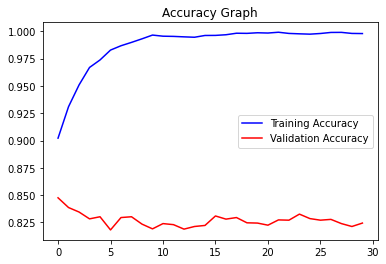

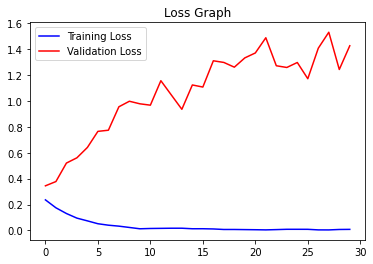

In [26]:
#plotting loss vs val_loss and acc vs val_acc
acc = hist['accuracy']
val_acc = hist['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = hist['loss']
val_loss = hist['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [27]:
y_pred = (model.predict(X_test) > 0.5).astype("int32")

In [28]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report

In [29]:
#plotting confusion matrix
confusion_matrix(y_test,y_pred)

array([[1693,  386],
       [ 343, 1731]])

In [30]:
#checking accuracy score
accuracy_score(y_test,y_pred)

0.8244642427161089

In [31]:
#checking classification report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.83      0.81      0.82      2079
           1       0.82      0.83      0.83      2074

    accuracy                           0.82      4153
   macro avg       0.82      0.82      0.82      4153
weighted avg       0.82      0.82      0.82      4153



In [32]:
#saving model
model.save('fake_news_classification.h5')
#saving weights
model.save_weights('weights.h5')

In [33]:
#custom testing
def new_review(new_review):
    ps = PorterStemmer()
  
    new_review = new_review
    new_review = re.sub('[^a-zA-Z]', ' ', new_review)
    new_review = new_review.lower()
    new_review = new_review.split()

    new_review = [ps.stem(word) for word in review if not word in stopwords.words('english')]
    new_review = ' '.join(new_review)
    new_corpus = [new_review]

    onehot_repr = [one_hot(words,voc_size)for words in new_corpus]
    embedded_docs = pad_sequences(onehot_repr,padding='pre',maxlen=sent_length)

    new_X_test = np.array(embedded_docs)
    new_y_pred = model.predict(new_X_test)
    return new_y_pred

new_review = new_review(str(input("Enter new review...")))
new_review

Enter new review...Hiiii this is not fake


array([[3.7241643e-05]], dtype=float32)

In [35]:
pred = (new_review > 0.5).astype("int32")
if pred[0]==1:
    print("This news is FAKE!!")
else:
    print("This news is TRUE!!")

This news is TRUE!!
